# Detectron 2

- The DETR model was trained on COCO 2017 object detection, a dataset consisting of 118k/5k annotated images for training/validation respectively.

### Source:
##### Implementation Guideline:
https://detectron2.readthedocs.io/en/latest/index.html
##### Paper:
https://arxiv.org/pdf/2005.12872.pdf
##### GitHub:
https://github.com/facebookresearch/detectron2  
https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md
##### Google Colab:
https://colab.research.google.com/drive/1hZNaaJafWEBAjrPffdVfYlKq_-zFg-KN?usp=sharing#scrollTo=uY1CU9GKZOnf  https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5
##### Youtube:
https://www.youtube.com/watch?v=I7O4ymSDcGw
##### Dataset:
https://arxiv.org/pdf/1612.01079.pdf  
https://bair.berkeley.edu/blog/2018/05/30/bdd/
##### Infos:
https://medium.com/@hirotoschwert/digging-into-detectron-2-47b2e794fabd  
https://speakerdeck.com/hirotohonda/digging-into-sample-assignment-methods-for-object-detection?slide=16



In [1]:
# Some basic setup:
# Setup detectron2 logger
import cv2
import random
import time
import os
import numpy as np
from matplotlib import pyplot as plt
from collections import defaultdict

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.utils.visualizer import ColorMode, Visualizer
from tqdm.notebook import tqdm_notebook

#### I converted the BDD100K dataset to Coco format with FiftyOne Script -> just register the dataset to detectron2

#### Folder structur:


- ###### converted_labels_train_coco:
  - labels.json
  - ###### train:
    - ....jpg
    - ....jpg
   
- ###### converted_labels_val_coco:
  - labels.json
  - ###### val:
    - ....jpg
    - ....jpg



In [2]:
register_coco_instances("my_dataset_train", {}, "/my_app/converted_labels_train_coco/labels.json", "/my_app/converted_labels_train_coco/train")
register_coco_instances("my_dataset_val", {}, "/my_app/converted_labels_val_coco/labels.json", "/my_app/converted_labels_val_coco/val")


#### Show random data with ground truth boxes

[01/03 07:55:17 d2.data.datasets.coco]: Loading /my_app/converted_labels_train_coco/labels.json takes 8.66 seconds.
WARNING [01/03 07:55:17 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/03 07:55:17 d2.data.datasets.coco]: Loaded 70000 images in COCO format from /my_app/converted_labels_train_coco/labels.json
[01/03 07:55:22 d2.data.datasets.coco]: Loading /my_app/converted_labels_val_coco/labels.json takes 1.71 seconds.
WARNING [01/03 07:55:22 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/03 07:55:22 d2.data.datasets.coco]: Loaded 10000 images in COCO format from /my_app/converted_labels_val_coco/labels.json


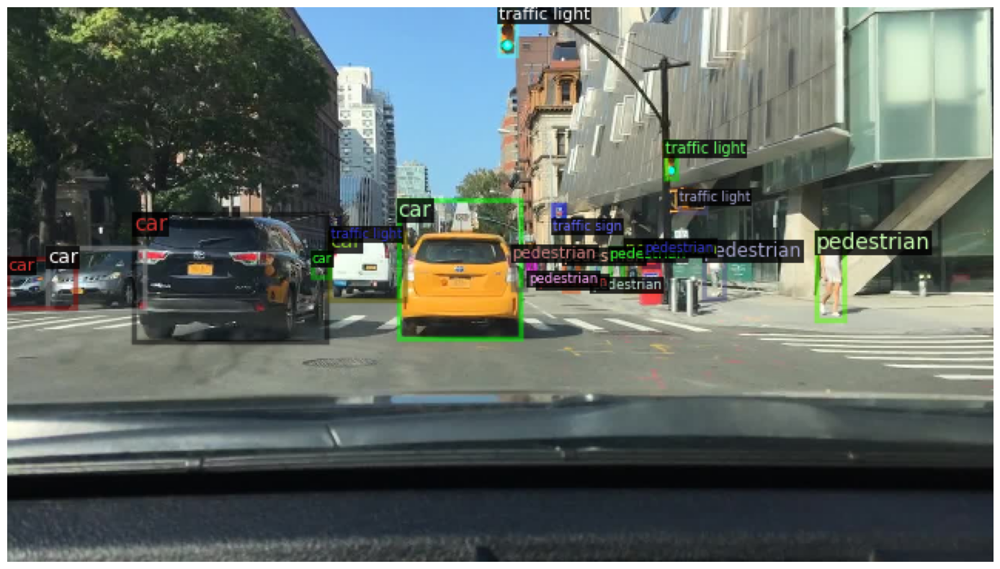

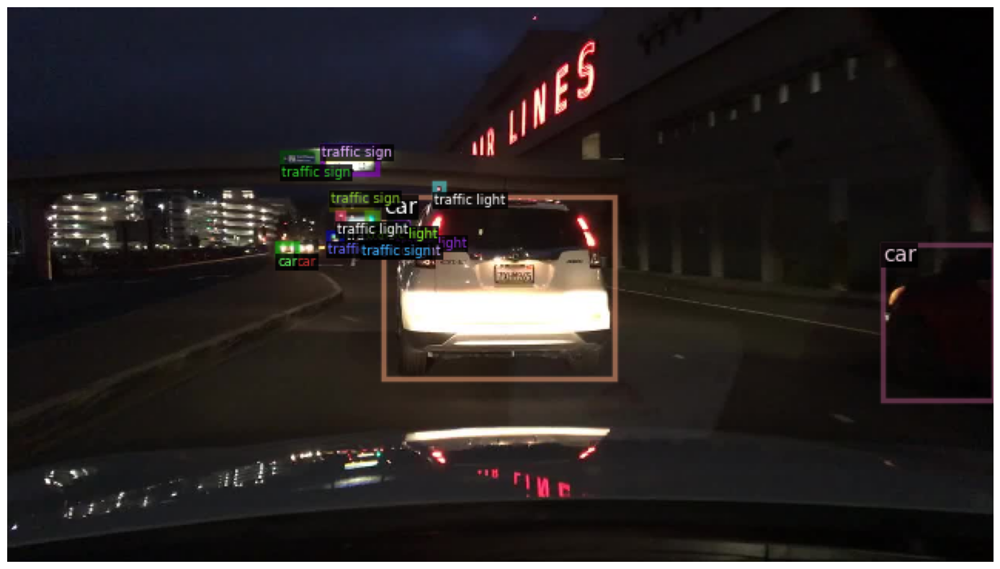

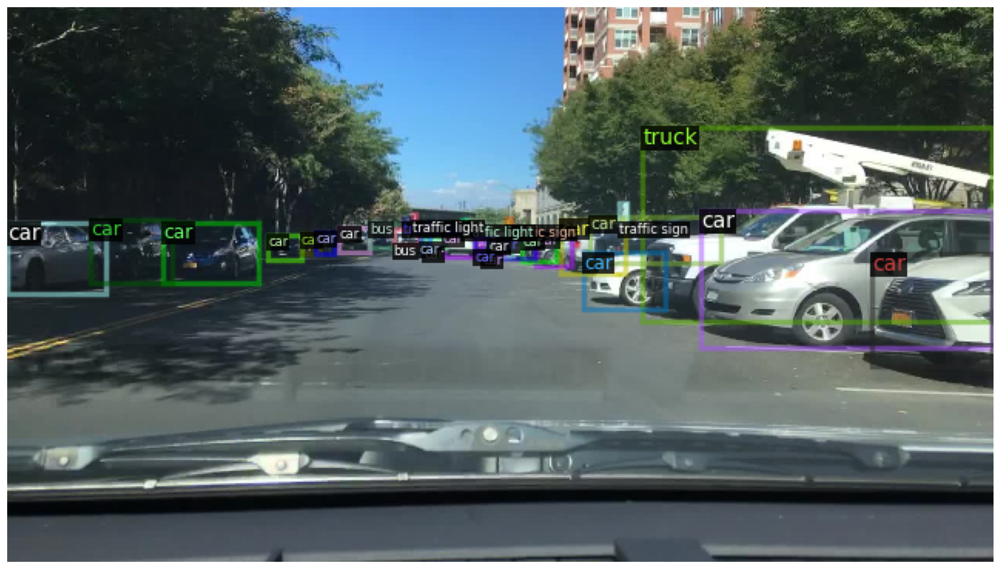

In [3]:
%matplotlib inline
# check dataset is reading correctly
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")


def visualize_random_images(dataset_name, num_images=3, figsize=(20, 10)):
    # check dataset is reading correctly
    my_dataset_train_metadata = MetadataCatalog.get(dataset_name)
    dataset_dicts = DatasetCatalog.get(dataset_name)

    # Randomly select 'num_images' from the dataset
    selected_images = random.sample(dataset_dicts, num_images)

    # Visualize the selected images
    for d in selected_images:
        img = cv2.imread(d["file_name"])
        visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
        out = visualizer.draw_dataset_dict(d)
        image = out.get_image()

        # Show the image with matplotlib
        plt.figure(figsize=figsize)
        plt.imshow(image)
        plt.axis('off')  # Optional: Deaktivieren Sie die Achsen
        plt.show()

visualize_random_images("my_dataset_val", num_images=3, figsize=(20, 10))

# set meta data for validation set (we'll usue this later for testing)
test_metadata = MetadataCatalog.get("my_dataset_train")

### Overview training data

In [4]:
#dataset_dicts
jpg_count = sum(1 for data in dataset_dicts if data['file_name'].lower().endswith('.jpg'))
print(f"Train images: {jpg_count}")

# Dictionary mit den Klassennamen
class_names = {
    0: 'traffic light',
    1: 'traffic sign',
    2: 'car',
    3: 'pedestrian',
    4: 'bus',
    5: 'truck',
    6: 'rider',
    7: 'bicycle',
    8: 'motorcycle',
    9: 'train',
    10: 'other vehicle',
    11: 'other person',
    12: 'trailer'
}

# Initialisieren Sie ein defaultdict, um die Anzahl jeder Klasse zu zählen
class_counts = defaultdict(int)

# Durchlaufen Sie das Dataset und zählen Sie die Anzahl jeder Klasse
for data in dataset_dicts:
    annotations = data.get('annotations', [])
    for annotation in annotations:
        category_id = annotation.get('category_id', None)
        if category_id is not None:
            class_counts[category_id] += 1

# Drucken Sie die Anzahl jeder Klasse mit den Klassennamen
for category_id, count in class_counts.items():
    class_name = class_names.get(category_id, 'Unknown Class')  # Setzen Sie 'Unknown Class', wenn die Klasse nicht im Dictionary gefunden wird
    print(f"Klasse {category_id} ({class_name}): {count} Annotationen")



Train images: 70000
Klasse 8 (motorcycle): 187871 Annotationen
Klasse 9 (train): 238270 Annotationen
Klasse 2 (car): 700703 Annotationen
Klasse 6 (rider): 92159 Annotationen
Klasse 1 (traffic sign): 11977 Annotationen
Klasse 12 (trailer): 27892 Annotationen
Klasse 7 (bicycle): 4560 Annotationen
Klasse 0 (traffic light): 7124 Annotationen
Klasse 3 (pedestrian): 3023 Annotationen
Klasse 11 (other person): 128 Annotationen
Klasse 5 (truck): 804 Annotationen
Klasse 4 (bus): 210 Annotationen
Klasse 10 (other vehicle): 71 Annotationen


### Config network

In [5]:
cfg = get_cfg() # initialize configuration
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")) # Define model
cfg.DATASETS.TRAIN = ("my_dataset_train",) # <- don't forget comma at end
cfg.DATASETS.TEST = () # you can implement a validation loader
cfg.DATALOADER.NUM_WORKERS = 0 # Can adjust for processes loading
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo (transfer learning!)
cfg.SOLVER.IMS_PER_BATCH = 4 # Image per batch per GPU
cfg.SOLVER.BASE_LR = 0.001  # pick a learning rate
cfg.SOLVER.MAX_ITER = 10000    # 300 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 32   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 13  # How many classes are in your dataset



### Check how network predict without training to compare later

[01/03 07:55:27 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x/139173657/model_final_68b088.pkl ...


Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (14, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (14,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (52, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (52,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias

[01/03 07:55:37 d2.data.datasets.coco]: Loading /my_app/converted_labels_train_coco/labels.json takes 9.53 seconds.
WARNING [01/03 07:55:37 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/03 07:55:38 d2.data.datasets.coco]: Loaded 70000 images in COCO format from /my_app/converted_labels_train_coco/labels.json


/opt/conda/lib/python3.10/site-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


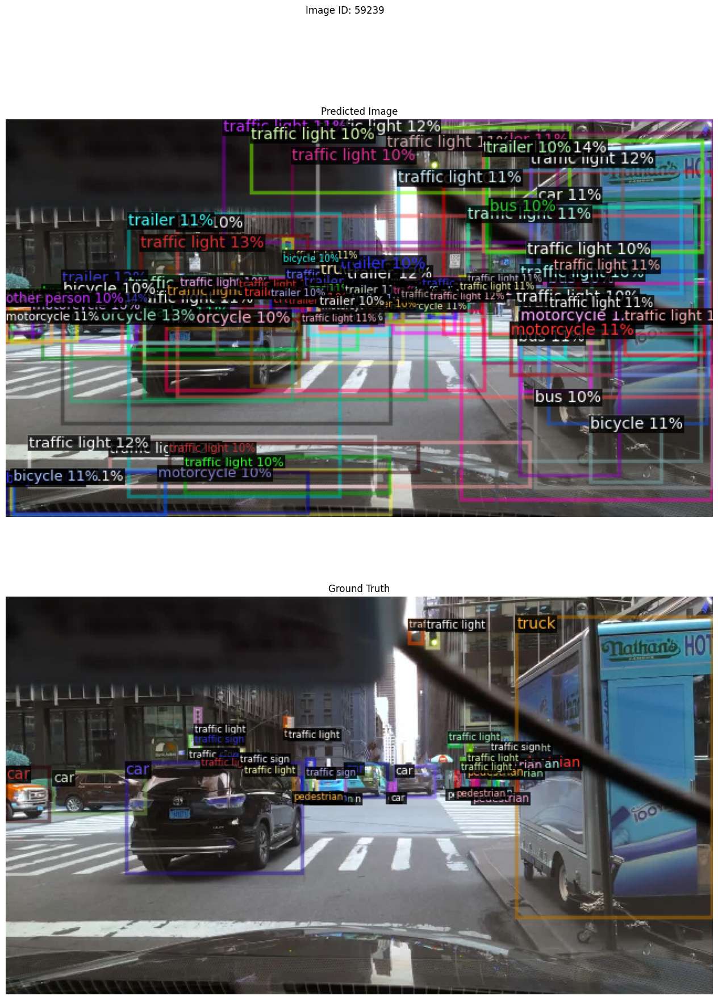

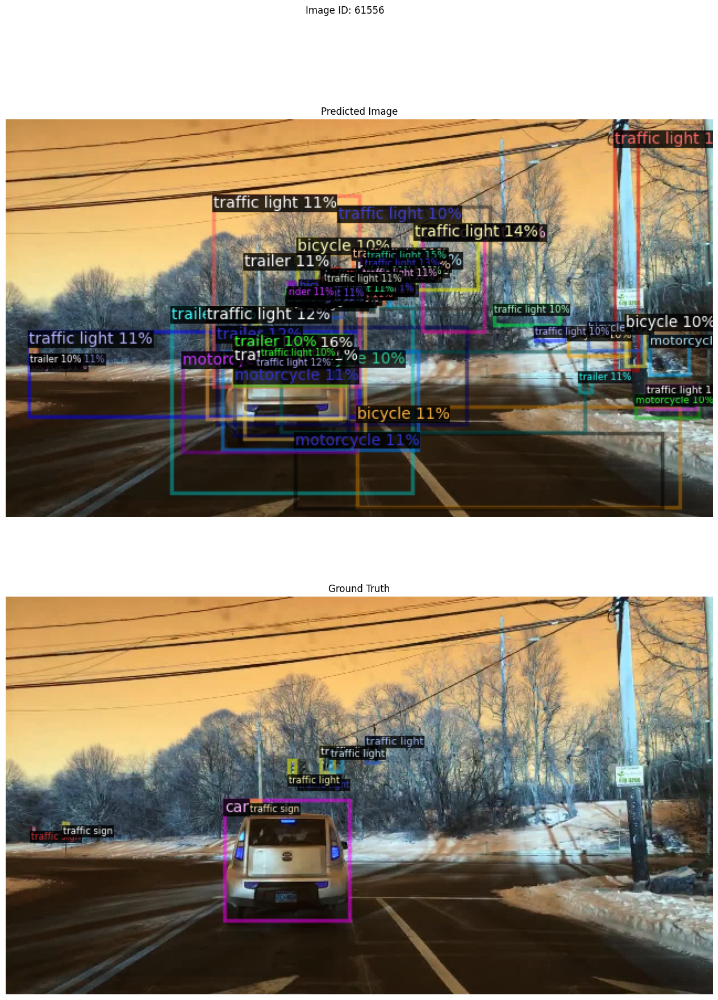

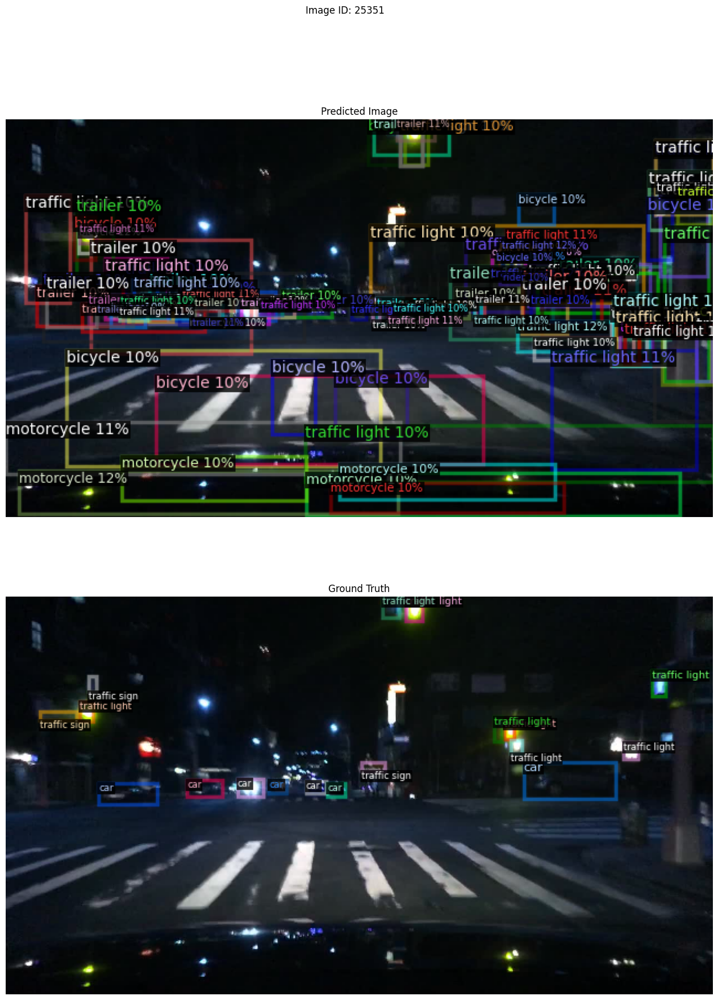

In [6]:
def visualize_predictions_and_ground_truth_untrained(dataset_name, model_cfg, num_images=3, figsize=(20, 15)):
    predictor = DefaultPredictor(cfg)

    # Load metadata for the dataset
    metadata = MetadataCatalog.get(dataset_name)

    # Function to get random images from the dataset
    def get_random_images():
        dataset_dicts = DatasetCatalog.get(dataset_name)
        return random.sample(dataset_dicts, num_images)

    # Visualize predictions and ground truth
    for d in get_random_images():
        img = cv2.imread(d["file_name"])

        # Get predictions for this image
        outputs = predictor(img)

        # Initialize visualizer for predictions
        visualizer_predictions = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
        out_predictions = visualizer_predictions.draw_instance_predictions(outputs["instances"].to("cpu"))

        # Initialize visualizer for ground truth
        visualizer_gt = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
        out_gt = visualizer_gt.draw_dataset_dict(d)

        # Plot both images (predictions above, ground truth below) with titles
        plt.figure(figsize=figsize)
        plt.subplot(2, 1, 1)
        plt.imshow(out_predictions.get_image()[:, :, ::-1])
        plt.title("Predicted Image")
        plt.axis('off')

        plt.subplot(2, 1, 2)
        plt.imshow(out_gt.get_image()[:, :, ::-1])
        plt.title("Ground Truth")
        plt.axis('off')

        plt.suptitle(f"Image ID: {d['image_id']}")  # Add image ID as main title
        plt.show()
    return predictor

# Beispielaufruf für ein untrainiertes Netzwerk
model = visualize_predictions_and_ground_truth_untrained("my_dataset_train", "COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml", num_images=3, figsize=(20, 20))

### Train

In [7]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[01/03 07:55:50 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (14, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (14,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (52, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (52,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias

[01/03 07:56:09 d2.engine.train_loop]: Starting training from iteration 0
[01/03 07:56:34 d2.utils.events]:  eta: 3:19:21  iter: 19  total_loss: 3.956  loss_cls: 2.582  loss_box_reg: 0.8461  loss_rpn_cls: 0.2641  loss_rpn_loc: 0.2349    time: 1.2055  last_time: 1.0943  data_time: 0.2316  last_data_time: 0.2190   lr: 1.9981e-05  max_mem: 11290M
[01/03 07:56:59 d2.utils.events]:  eta: 3:25:30  iter: 39  total_loss: 3.511  loss_cls: 2.268  loss_box_reg: 0.841  loss_rpn_cls: 0.2032  loss_rpn_loc: 0.2306    time: 1.2306  last_time: 1.2445  data_time: 0.2297  last_data_time: 0.1885   lr: 3.9961e-05  max_mem: 11290M
[01/03 07:57:24 d2.utils.events]:  eta: 3:22:55  iter: 59  total_loss: 2.788  loss_cls: 1.625  loss_box_reg: 0.81  loss_rpn_cls: 0.1143  loss_rpn_loc: 0.2757    time: 1.2384  last_time: 1.3696  data_time: 0.2563  last_data_time: 0.2134   lr: 5.9941e-05  max_mem: 11290M
[01/03 07:57:49 d2.utils.events]:  eta: 3:21:48  iter: 79  total_loss: 2.133  loss_cls: 0.9798  loss_box_reg: 0.8

### Test with val dataset

In [8]:
# Initialize config
cfg = get_cfg()
# Must be same as model trained in. Sense default: COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
# Path to saved model weights (trained model)
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
# if using datasets for metadata
cfg.DATASETS.TEST = ("my_dataset_val", )
cfg.MODEL.DEVICE = "cuda"
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 13
# Threshhold to show predictions
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9
# create predictor instance to use
predictor = DefaultPredictor(cfg)



[01/03 11:24:22 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [9]:
evaluator = COCOEvaluator("my_dataset_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

[01/03 11:24:22 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [01/03 11:24:22 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [01/03 11:24:24 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/03 11:24:24 d2.data.datasets.coco]: Loaded 10000 images in COCO format from /my_app/converted_labels_val_coco/labels.json
[01/03 11:24:27 d2.data.build]: Distribution of instances among all 13 categories:
|   category   | #instances   |   category   | #instances   |   category    | #instances   |
|:------------:|:-------------|:------------:|:-------------|:-------------:|:-------------|
|   bicycle    | 1039         |     bus      | 1660         |      car      | 102837       |
|  motorcycle  | 460          | other person | 1            | other vehicle | 85           

WARNING [01/03 12:16:24 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/03 12:16:25 d2.data.datasets.coco]: Loaded 10000 images in COCO format from /my_app/converted_labels_val_coco/labels.json


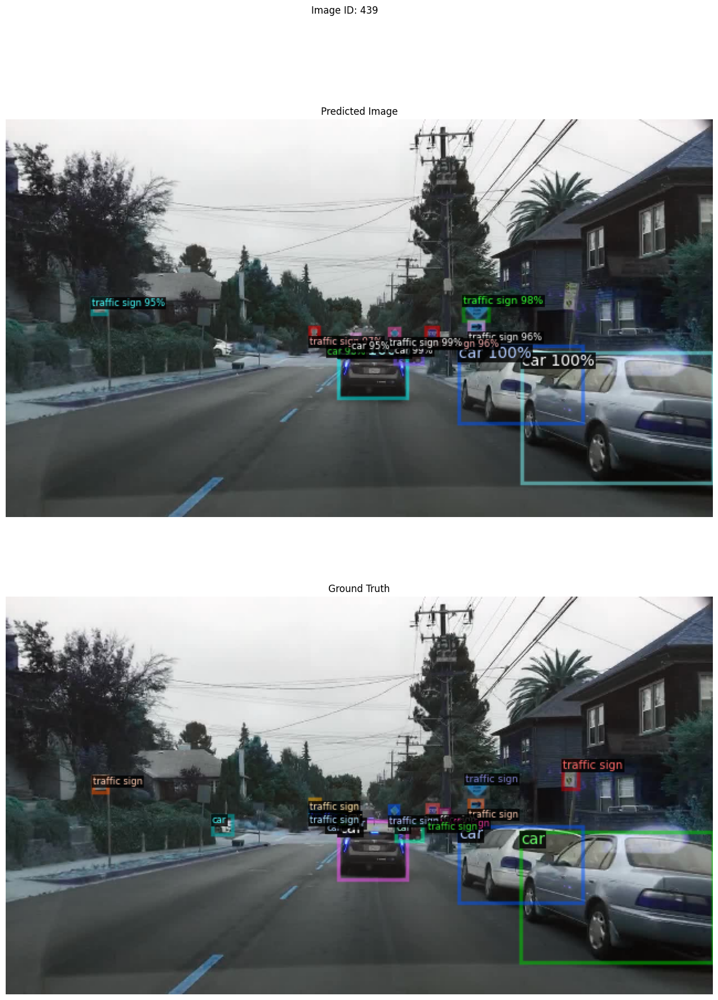

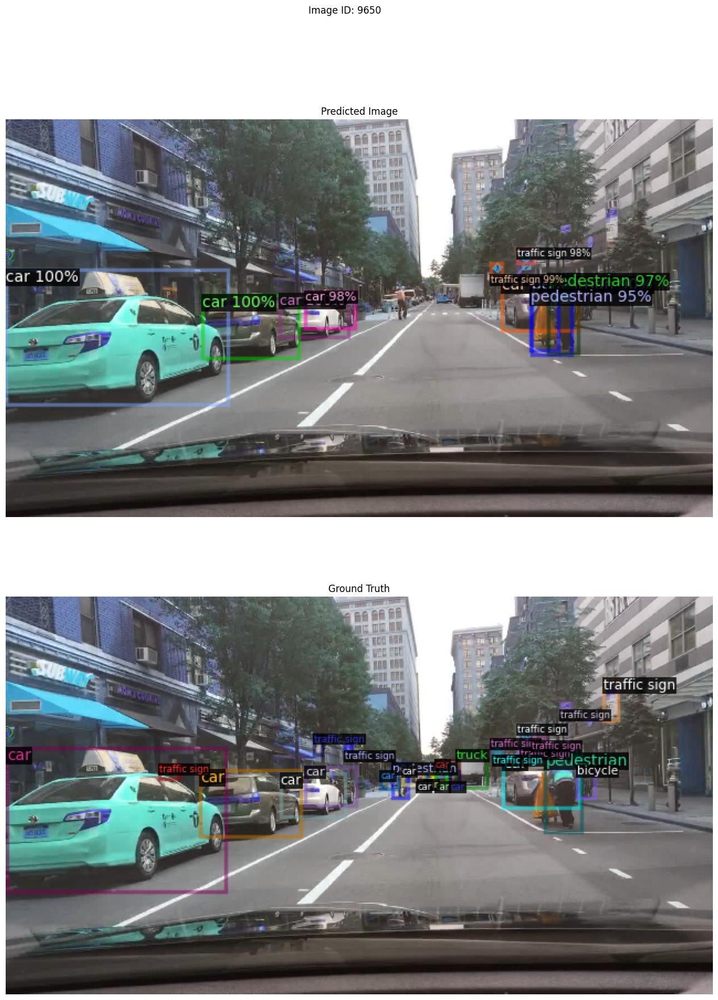

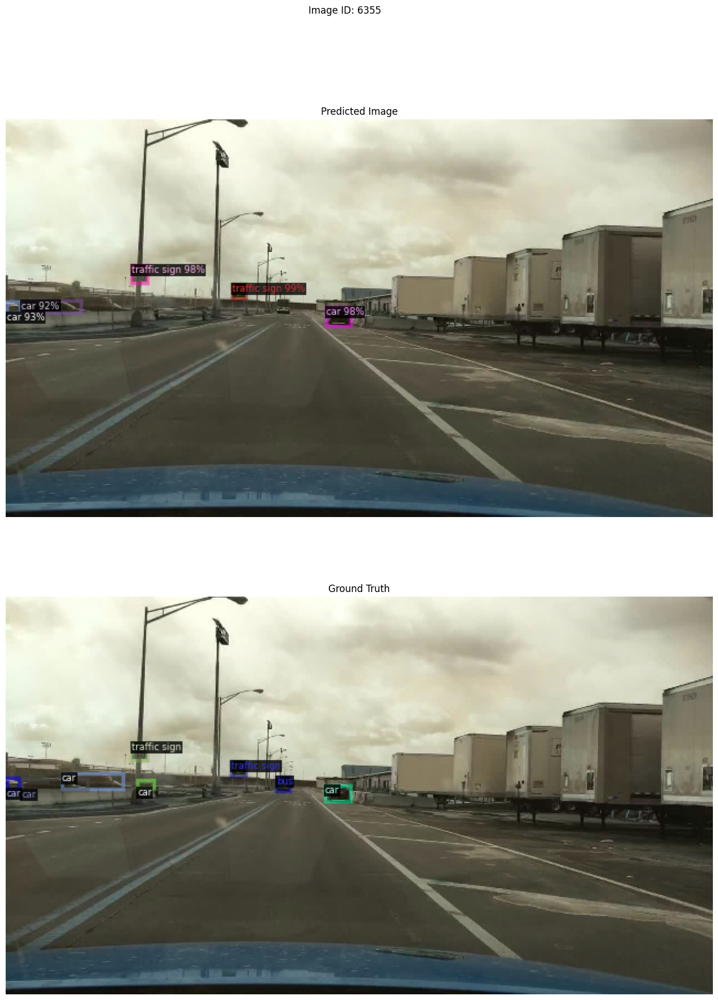

In [10]:
def visualize_predictions_and_ground_truth(dataset_name, model_cfg, model_weights, num_images=3, figsize=(20, 15)):
    # Load metadata for the dataset
    metadata = MetadataCatalog.get(dataset_name)

    # Function to get random images from the dataset
    def get_random_images():
        dataset_dicts = DatasetCatalog.get(dataset_name)
        return random.sample(dataset_dicts, num_images)

    # Visualize predictions and ground truth
    for d in get_random_images():
        img = cv2.imread(d["file_name"])

        # Get predictions for this image
        outputs = predictor(img)

        # Initialize visualizer for predictions
        visualizer_predictions = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
        out_predictions = visualizer_predictions.draw_instance_predictions(outputs["instances"].to("cpu"))

        # Initialize visualizer for ground truth
        visualizer_gt = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
        out_gt = visualizer_gt.draw_dataset_dict(d)

        # Plot both images (predictions above, ground truth below) with titles
        plt.figure(figsize=figsize)
        plt.subplot(2, 1, 1)
        plt.imshow(out_predictions.get_image()[:, :, ::-1])
        plt.title("Predicted Image")
        plt.axis('off')

        plt.subplot(2, 1, 2)
        plt.imshow(out_gt.get_image()[:, :, ::-1])
        plt.title("Ground Truth")
        plt.axis('off')

        plt.suptitle(f"Image ID: {d['image_id']}")  # Add image ID as main title
        plt.show()

# Beispielaufruf
visualize_predictions_and_ground_truth("my_dataset_val", "COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml", "/path/to/model_final.pth", num_images=3, figsize=(20, 20))



### Benchmark inference speed

In [11]:
# Annahme: dataset_dicts ist Ihr Validierungsdatensatz
# dataset_dicts = DatasetCatalog.get("my_dataset_val")

times = []
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])

    # Benchmark: Messen Sie die Inferenzzeit
    for i in range(20):
        start_time = time.time()
        outputs = predictor(im)
        delta = time.time() - start_time
        times.append(delta)

    mean_delta = np.array(times).mean()
    fps = 1 / mean_delta
    print("Durchschnitt (Sekunden): {:.2f}, FPS: {:.2f}".format(mean_delta, fps))

Durchschnitt (Sekunden): 0.30, FPS: 3.34
Durchschnitt (Sekunden): 0.30, FPS: 3.34
Durchschnitt (Sekunden): 0.30, FPS: 3.34


### Check driving video

In [12]:
# Video-Datei öffnen
video = cv2.VideoCapture('video1.mp4')
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
frames_per_second = video.get(cv2.CAP_PROP_FPS)
num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

# Video-Writer initialisieren
video_writer = cv2.VideoWriter('out.mp4', fourcc=cv2.VideoWriter_fourcc(*"mp4v"), fps=float(frames_per_second), frameSize=(width, height), isColor=True)

# Visualizer initialisieren
metadata = MetadataCatalog.get(cfg.DATASETS.TEST[0])
v = VideoVisualizer(metadata, ColorMode.IMAGE)

# Predictor initialisieren
predictor = DefaultPredictor(cfg)

def runOnVideo(video, maxFrames):
    """ Funktion, die den Predictor auf jedes Frame im Video anwendet
    und das Frame mit den Vorhersagen zurückgibt.
    """

    readFrames = 0
    while True:
        hasFrame, frame = video.read()
        if not hasFrame:
            break

        # Vorhersagen für dieses Frame erhalten
        outputs = predictor(frame)

        # Stelle sicher, dass das Frame farbig ist
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        # Visualisierung der Vorhersagen mit dem Video-Visualizer erstellen
        visualization = v.draw_instance_predictions(frame, outputs["instances"].to("cpu"))

        # Matplotlib RGB-Format in OpenCV BGR-Format umwandeln
        visualization = cv2.cvtColor(visualization.get_image(), cv2.COLOR_RGB2BGR)

        yield visualization

        readFrames += 1
        if readFrames > maxFrames:
            break

# Durchlaufe die Frames des Videos
for visualization in tqdm_notebook(runOnVideo(video, num_frames), total=num_frames):

    # Schreibe in die Videodatei
    video_writer.write(visualization)

# Ressourcen freigeben
video.release()
video_writer.release()
cv2.destroyAllWindows()

[01/03 12:16:48 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


  0%|          | 0/300 [00:00<?, ?it/s]